# Satellite Image Data Analysis Using Numpy

## Data Source: Satellite Image from WIFIRE(University of Carlifornia San Diego) project.
**WIFIRE** is an integrated system for wildfire analysis which is capable of handling changing urban dynamics and climate. The system integrates networked observations from a variety of sources including heterogenous satellite data and real time remote sensor data. It then processes all these data using computational techniques in signal processing, visualization, predictive fire modelling and data assimilation in a scalable way. The result is a system capables of monitoring weather patterns and other factors to help predict a wildfire's rate of spread. For more information: https://wifire.ucsd.edu/

The libraries we need: numpy, scipy, matplotlib

In [30]:
%matplotlib inline
import numpy as np
from scipy import misc
import matplotlib.pyplot as plt

Choose a WIFIRE satellite image as an ndarray and display its type.

In [31]:
from skimage import data

photo_data = misc.imread('./wifire/sd-3layers.jpg')
type(photo_data)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until


numpy.ndarray

See what is in this image

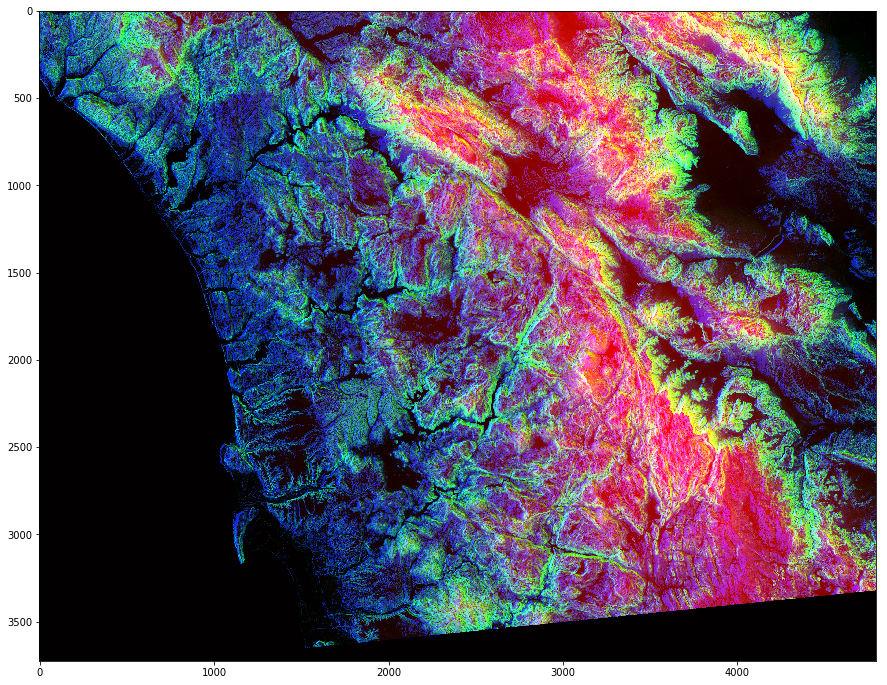

In [32]:
plt.figure(figsize=(15,15)) # setup a frame size: 15,15
plt.imshow(photo_data)

In [33]:
photo_data.shape
#print(photo_data)

(3725, 4797, 3)

The shape of the ndarray shows that it is a 3 layered matrix. The first two numbers here are length and width, and the third number(i.e 3) is for three layers: Red, Green and Blue.

Exploring the RGB color mapping in the photo:
* **RED** pixel indicates Altitude
* **BLUE** pixel indicates Aspect
* **GREEN** pixel indicates Slope

The higher values indicate higher altitude, aspect and slope.

In [34]:
photo_data.size

53606475

In [35]:
photo_data.min(), photo_data.max()

(0, 255)

In [36]:
photo_data.mean()

75.77772429543259

Pixel on the 150th row and 250th column

In [37]:
photo_data[150, 250]
# result shows that this particular pixel has a lot of blue in it.

array([ 15,  42, 233], dtype=uint8)

In [38]:
photo_data[150, 250, 1] # 1 is the index = green.

42

## Set a pixel to all Zeros
We can set all three layer in a pixel as ones by assigning zero globally to that(row, column) pairing. However, setting one pixel to zero is not noticeable.

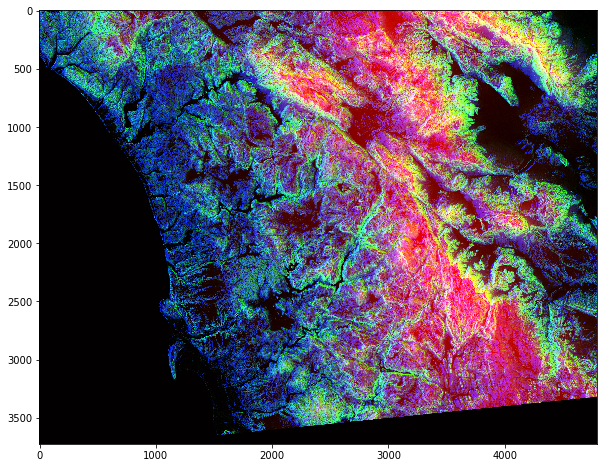

In [39]:
photo_data[150, 250] = 0
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

## Changing colors in a Range
We can use a range to change the pixel values.

Let's set the green layer for rows 200 - 800 to full intensity

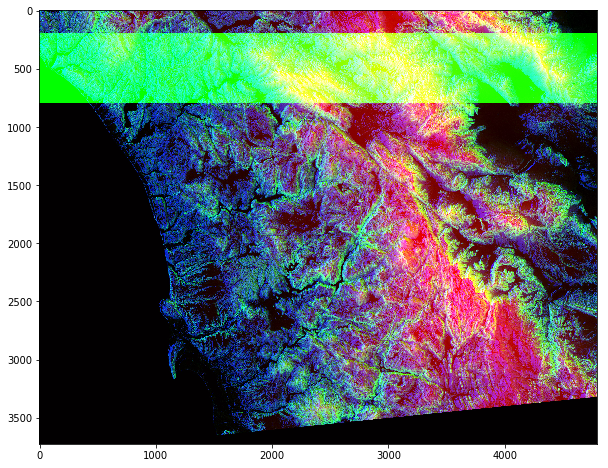

In [40]:
# 1 is the index of the value in RGB.
# The code intensifies green
photo_data[200:800, : ,1] = 255
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

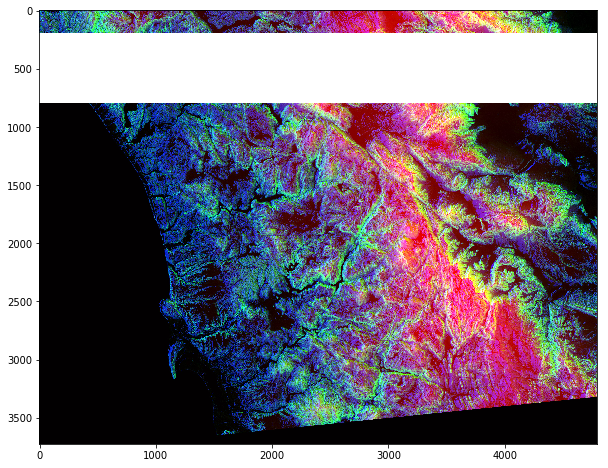

In [41]:
# No index. Implies all pixels in RGB
# All the columns in the range 200-800 for rows to be full intesity.
photo_data[200:800, :] = 255
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

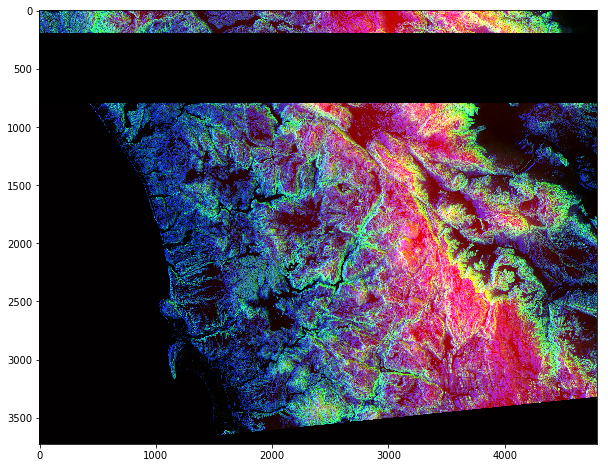

In [42]:
# Muting down all the colors
photo_data[200:800, :] = 0
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

## Pick all pixes with low values

In [43]:
# Reload the image to photo_data since its changed abit.
photo_data = misc.imread('./wifire/sd-3layers.jpg')
print("Shape of photo_data:", photo_data.shape)
low_value_filter = photo_data < 200
print("Shape of low_value_filter:", low_value_filter.shape)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


Shape of photo_data: (3725, 4797, 3)
Shape of low_value_filter: (3725, 4797, 3)


## Filtering out low values
Whenever the low_value_filter is True, set value to 0.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


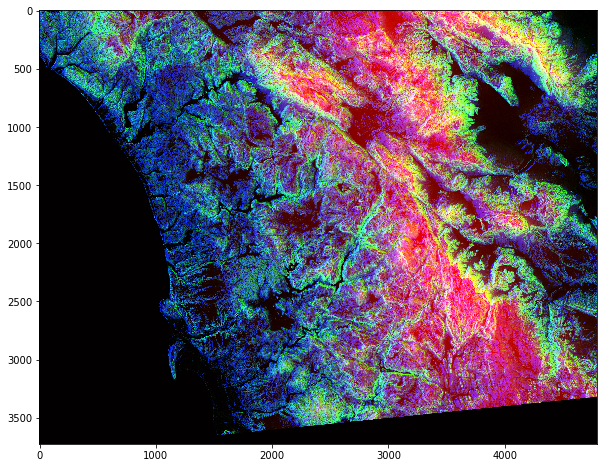

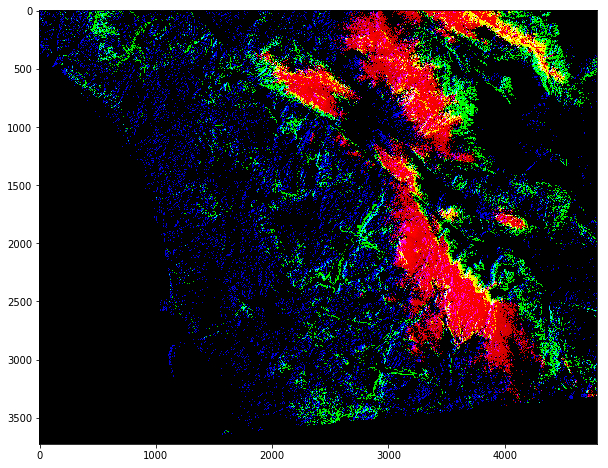

In [44]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)
photo_data[low_value_filter] = 0
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

## More Row and Column Operations
You can design complex patterns by making columns a function of rows or vice-versa. Here we try a linear relationship between rows and columns

In [45]:
rows_range = np.arange(len(photo_data))
cols_range = rows_range
print(type(rows_range))

<class 'numpy.ndarray'>


In [46]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
photo_data[rows_range, cols_range] = 255

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


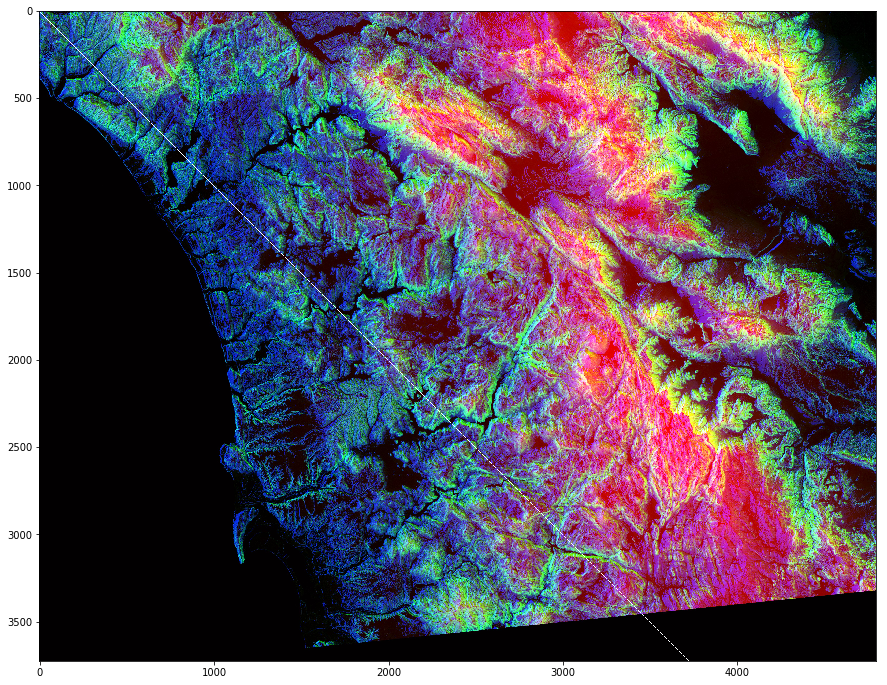

In [47]:
plt.figure(figsize=(15, 15))
plt.imshow(photo_data)

## Masking Images
A mask is in the shape of a circular disc.

In [48]:
total_rows, total_cols, total_layers =  photo_data.shape
print("photo_data = ", photo_data.shape)
# Create two mesh grids x and y
# ogrid function helps to vectorize the distance from the center
# ogrid is a compact method of creating a multidimensional ndarray
# operations in single lines.
# ogrid is a function of the two variables. Returns as an ndarray
# orgid returns the range of total rows and range of total columns
X, Y = np.ogrid[:total_rows, :total_cols]
print("X =",X.shape," and Y =", Y.shape)

photo_data =  (3725, 4797, 3)
X = (3725, 1)  and Y = (1, 4797)


In [49]:
center_row, center_col = total_rows / 2, total_cols / 2
# print("center_row =", center_row, "AND center_col =", center_col)
# Use the points X and Y to calculate points that are further than
# the radius
# print("Using center_row and x vector:", X - center_row)
# print('')
# print("Using center_col and y vector:", Y - center_col)
dist_from_center = (X - center_row)**2 + (Y - center_col)**2
# print('')
# print("dist_from_center =", dist_from_center)
# print('')
radius = (total_rows / 2)**2
# print("Radius =", radius)
circular_mask = (dist_from_center > radius)
# print('')
# print(circular_mask)
# print('')
# range query
# print(circular_mask[1500:1700,2000:2200])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


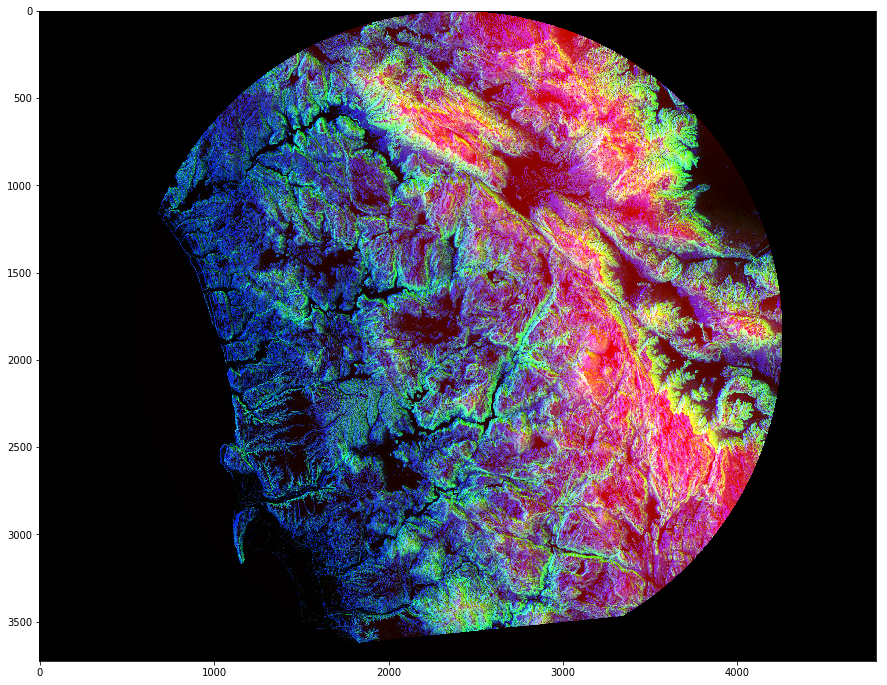

In [50]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
# mutes down the areas outside the circle
photo_data[circular_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Further Masking
You can further improve the mask. Just get upper half disc

In [51]:
X,Y = np.ogrid[:total_rows, :total_cols]
# this line generates a mask for all rows above the center
half_upper = X < center_row
# Use the two filters; half_upper and circular_mask to give
# values of the rows that are in the upper disc and those that are
# around the circle.
half_upper_mask = np.logical_and(half_upper, circular_mask)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


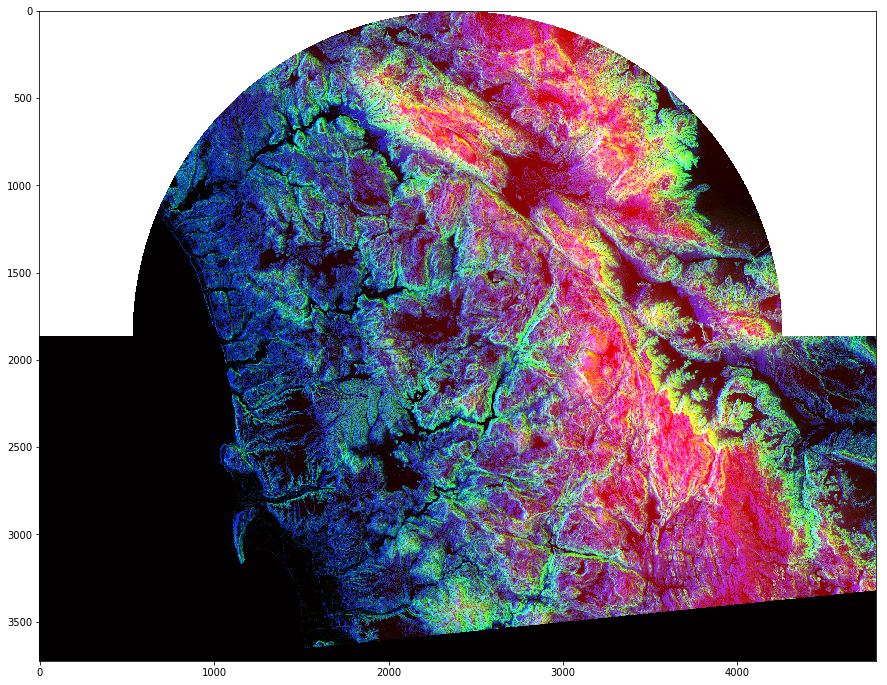

In [52]:
import random
photo_data = misc.imread('./wifire/sd-3layers.jpg')
photo_data[half_upper_mask] = 255
# Using the assignment,brings an effect in the intesity values.
# Its an intensity value of high between 200 and 255
# photo_data[half_upper_mask] = random.randint(200,255)
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Processing of RED Pixels
Remember that red pixels tells about height. Let's try to highlight all the high altitude areas by detecting high intensity **RED** pixels and muting down other areas.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


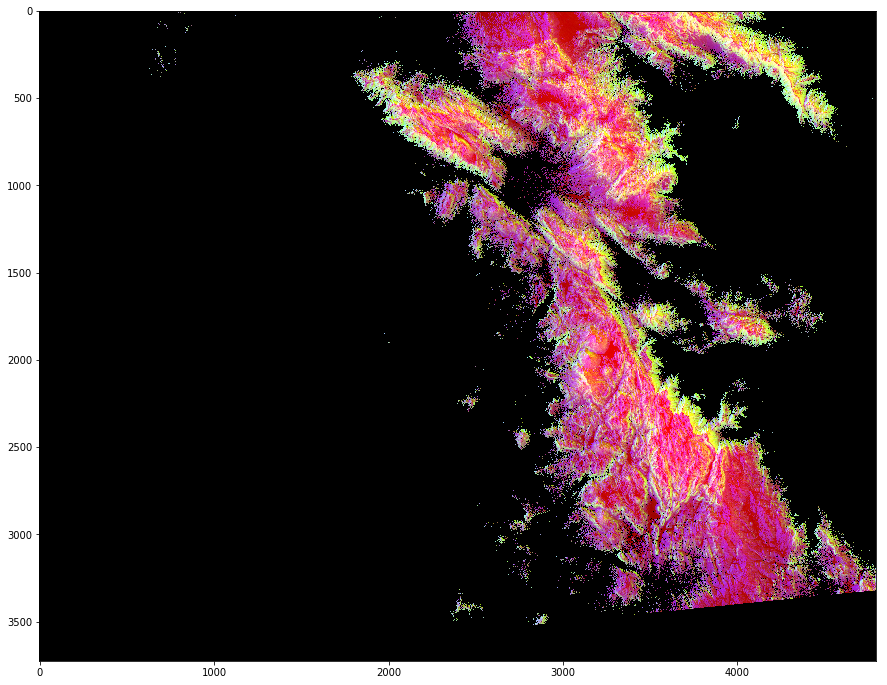

In [53]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
red_mask = photo_data[:, : ,0] < 150

photo_data[red_mask] = 0
# Displays the high elevation areas.
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Detecting Highly-Green Pixels

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


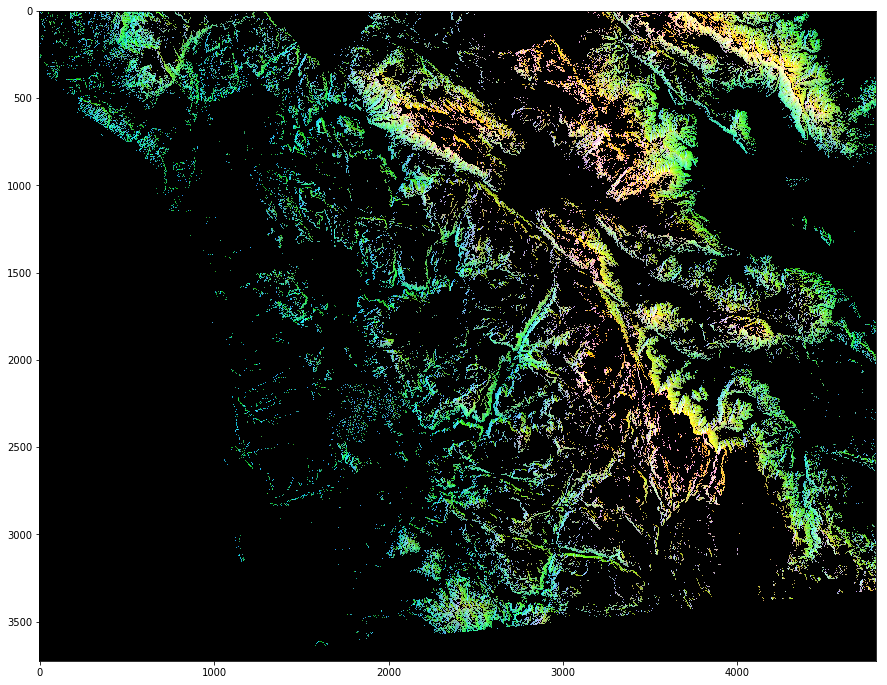

In [54]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
green_mask = photo_data[:, :, 1] < 150

photo_data[green_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Detecting Highly-Blue Pixels

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


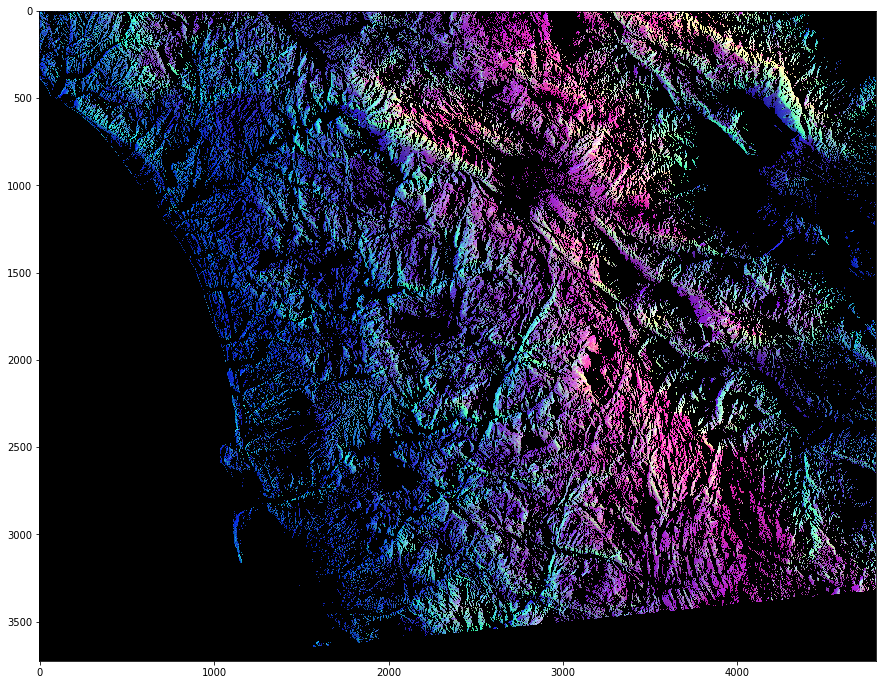

In [55]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
blue_mask = photo_data[:, :, 2] < 150

photo_data[blue_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

### Composite masks that takes thresholds on all three layers: RED, GREEN and BLUE

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


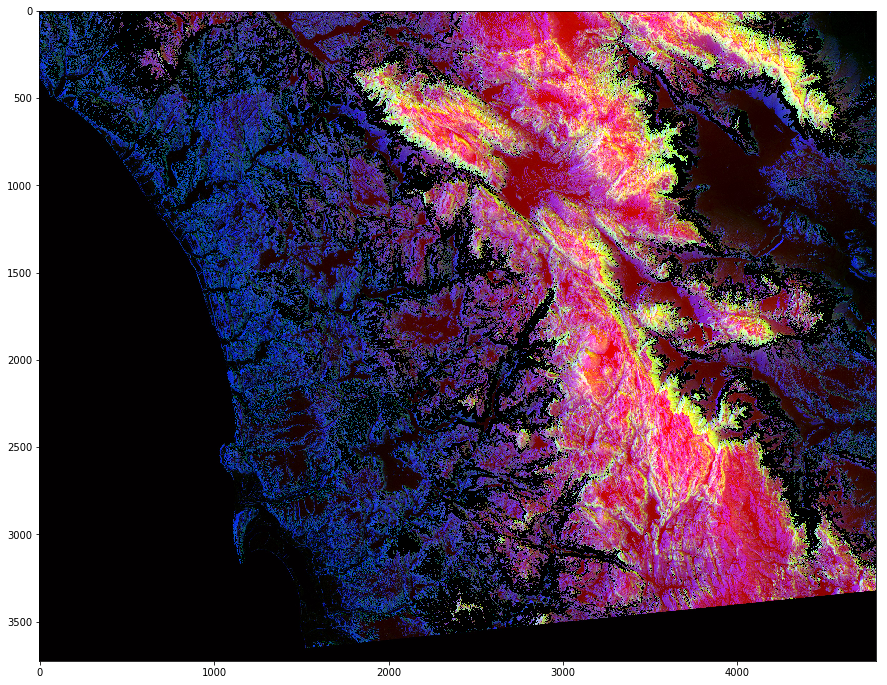

In [56]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

red_mask = photo_data[:, :, 0] < 150 # high elevation
green_mask = photo_data[:, :, 1] > 100 # high aspect
blue_mask = photo_data[:, :, 2] < 100 # low slope

final_mask = np.logical_and(red_mask, green_mask, blue_mask)
photo_data[final_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)